## Простой анализ данных.

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

sns.set(style='whitegrid', font_scale=1, palette='Set2')

/tmp/ipykernel_66120/3045840317.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [3]:
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

### Задача 2

<a target="_blank" href="https://www.yelp.com/">Yelp</a> — веб-сайт для поиска на местном рынке услуг, например ресторанов или парикмахерских, с возможностью добавлять и просматривать рейтинги и обзоры этих услуг. Для популярных бизнесов имеются сотни обзоров. Для обозревателей на сайте предусмотрены элементы социальной сети.

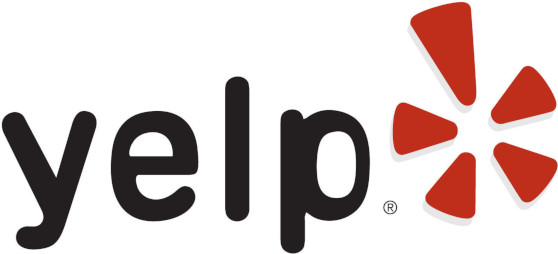

_____________

Вам предоставляется следующая информация о компаниях на Yelp:

Файл `yelp_business.csv`:
* `business_id` — уникальный идентификатор компании;
* `name` — имя компании;
* `address`, `city`, `state` — месторасположении компании;
* `latitude`, `longitude` — географические координаты;
* `categories` — категории услуг компании.

Файл `yelp_review.csv`, содержащий оценки пользователей:
* `business_id` — идентификатор компании, соответствующий файлу `yelp_business.csv`;
* `stars` — поставленная пользователем оценка от 1 до 5.

В целях сокращения объема файла, текстовые отзывы пользователей не были включены.

Оригинальную версию датасета в формате `json` можно посмотреть по <a target="_blank" href="https://www.kaggle.com/yelp-dataset/yelp-dataset/data">ссылке</a>, но использовать нужно выданные данные.

_____________

**Что нужно сделать:** 

* Найти город с наибольшим количеством компаний;
* Для этого города определить районы с наиболее качественными услугами. <a target="_blank" href="https://yandex.ru/company/researches/2017/msk_mobile_map">Пример</a> с несколько другой задачей.
* А также найти рестораны с наилучшими отзывами.


*Далее в условии встречаются различные подсказки, как можно выполнить определенные части задачи. Вы можете их игнорировать и делать иным способом для получения **того же самого промежуточного результата**. Однако, если ваше решение окажется **значительно** менее эффективным (по скорости, количеству и красоте кода) по сравнению с предполагаемым, баллы могут быть снижены.* 

------

#### 1. Город с наибольшим количеством компаний

Загрузите данные из файла `yelp_business.csv` с помощью функции `pd.read_csv`. Посмотрите на первые несколько строк с помощью метода `head`.

In [4]:
data_business = pd.read_csv("yelp_business.csv", index_col=0)
data_business.head()

,business_id,name,neighborhood,address,city,state,postal_code,latitude,longitude,is_open,categories
0,FYWN1wneV18bWNgQjJ2GNg,"""Dental by Design""",NaN,"""4855 E Warner Rd, Ste B9""",Ahwatukee,AZ,85044,33.330690,-111.978599,1,Dentists;General Dentistry;Health & Medical;Or...
1,He-G7vWjzVUysIKrfNbPUQ,"""Stephen Szabo Salon""",NaN,"""3101 Washington Rd""",McMurray,PA,15317,40.291685,-80.104900,1,Hair Stylists;Hair Salons;Men's Hair Salons;Bl...
2,KQPW8lFf1y5BT2MxiSZ3QA,"""Western Motor Vehicle""",NaN,"""6025 N 27th Ave, Ste 1""",Phoenix,AZ,85017,33.524903,-112.115310,1,Departments of Motor Vehicles;Public Services ...
3,8DShNS-LuFqpEWIp0HxijA,"""Sports Authority""",NaN,"""5000 Arizona Mills Cr, Ste 435""",Tempe,AZ,85282,33.383147,-111.964725,0,Sporting Goods;Shopping
4,PfOCPjBrlQAnz__NXj9h_w,"""Brick House Tavern + Tap""",NaN,"""581 Howe Ave""",Cuyahoga Falls,OH,44221,41.119535,-81.475690,1,American (New);Nightlife;Bars;Sandwiches;Ameri...


Найдите пять городов, по которым присутствует информация о наибольшем количестве компаний. В таблице должен быть указан город (название) и количество компаний в этом городе.

*Подсказка.* Для выполнения стоит воспользоваться методами `groupby`, `count`, `sort_values`, `head`.

In [5]:
data_business['city'].value_counts().head(5).reset_index()

,city,count
0,Las Vegas,26775
1,Phoenix,17213
2,Toronto,17206
3,Charlotte,8553
4,Scottsdale,8228


Пусть `N` &mdash; город с наибольшим количеством компаний. Оставьте в таблице только записи, соответствующие городу `N`. Нанесите все эти компании на график, в котором по оси $x$ отметьте долготу, а по оси $y$ &mdash; широту.

In [6]:
with sns.plotting_context(font_scale=0.2), sns.axes_style("darkgrid"):
    plt.figure(figsize=(6, 5))
    
    ax = sns.scatterplot(
        data=data_business[data_business['city'] == 'Las Vegas'], x="longitude", y="latitude", s=50, alpha=0.9
    )
    
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")

Сам город находится в сгустке точек. Есть какие-то компании, которые приписаны к этому городу, но находятся далеко от него. Избавьтесь от них, подобрав некоторые границы значений широты и долготы. Изобразите все компании на новом графике. На этом графике должны выделяться некоторые улицы. 

Сначала сузим в прямоугольник по долготе и широте [-120, -110] x [30, 40] соответственно, затем, небольшим подбором, к [-115.4, -115] x [35.9, 36.4]

In [7]:
with sns.plotting_context(font_scale=0.2), sns.axes_style("darkgrid"):
    plt.figure(figsize=(12, 25))
    
    data_first = data_business[(data_business['city'] == 'Las Vegas') 
                               & (-120 < data_business['longitude']) & (data_business['longitude'] < -110) 
                                & (30 < data_business['latitude']) & (data_business['latitude'] < 40)]
    
    plt.subplot(4, 2, 1)
    ax = sns.scatterplot(
        data=data_first, x="longitude", y="latitude", s=10, alpha=0.9
    )
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    
    data_LasVegas = data_business[(data_business['city'] == 'Las Vegas') 
                               & (-115.4 < data_business['longitude']) & (data_business['longitude'] < -115) 
                                & (35.9 < data_business['latitude']) & (data_business['latitude'] < 36.4)]
    
    plt.subplot(4, 2, 2)
    ax = sns.scatterplot(
        data=data_LasVegas, x="longitude", y="latitude", s=12, alpha=0.5
    )
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")

Разберитесь с тем, как подгрузить интерактивную карту города в качестве фона графика. Можно пойти двумя следующими способами.
1. Изучить <a href="https://miptstats.github.io/courses/python/11_plotly.html" target="_blank">материалы</a> по библиотеке <a href="https://plotly.com/python/" target="_blank"><b>Plotly</b></a>. Возможно, потребуется также заглянуть в документацию.
1. Поразбираться с библиотекой <a href="https://github.com/python-visualization/folium" target="_blank"><b>Folium</b></a>. Посмотрите множество <a href="https://nbviewer.org/github/python-visualization/folium/tree/main/examples/" target="_blank">примеров</a>, может также помочь <a href="https://proglib.io/p/python-web-map" target="_blank">статья на русском</a>.

*Внимание!* Интерактивная карта может не сохраниться в ноутбуке, а если сохранится, то вес ноутбука может превзойти 20 Мб, и его не получится отправить боту. В любом случае **<u>необходимо сохранить карту в html и отправить ее отдельным файлом в бот.</u>** При этом каждый файл html должен не превышать 20 Мб, присылать файлы в архиве нельзя. Аналогично со всеми следующими интерактивными графиками в этом задании.

In [8]:
fig = px.scatter_mapbox(data_LasVegas, lat="latitude", lon="longitude", hover_name="name", 
                        color_continuous_scale="Blues", zoom=9.5)

fig.update_traces(marker=dict(opacity=0.3))

fig.update_layout(
    title="Предприятия Лас-Вегаса",
    mapbox_style="open-street-map",
    autosize=True,
    margin=dict(t=50)
)
fig.write_html("1_full.html")

Если все получилось, вы молодцы! Далее в этой задаче тоже стройте интерактивные карты. Если нет желания разбираться с интерактивными графиками, можно построить статичные, но баллы будут снижены.

#### 2. Оценки компаний

Для выполнения задания нужно посчитать среднюю оценку каждой компании, а также количество выставленных оценок.

Загрузите таблицу оценок `yelp_review.csv`.

In [9]:
data_review =  pd.read_csv("yelp_review.csv", index_col=0)
data_review.head()

,business_id,stars
0,AEx2SYEUJmTxVVB18LlCwA,5
1,VR6GpWIda3SfvPC-lg9H3w,5
2,CKC0-MOWMqoeWf6s-szl8g,5
3,ACFtxLv8pGrrxMm6EgjreA,4
4,s2I_Ni76bjJNK9yG60iD-Q,4


В подгруженной таблице оценок оставьте только компании города `N`. Для этого установите значения `business_id` в качестве индекса у таблицы оценок и воспользуйтесь методом `loc`. 

*Подсказка.* Чтобы индекс снова сделать полем таблицы, можно воспользоваться методом `reset_index`.

In [10]:
review_LasVegas = data_review.set_index("business_id").loc[data_LasVegas["business_id"]]
review_LasVegas

,stars
business_id,
kCoE3jvEtg6UVz5SOD3GVw,4
kCoE3jvEtg6UVz5SOD3GVw,1
kCoE3jvEtg6UVz5SOD3GVw,5
kCoE3jvEtg6UVz5SOD3GVw,5
kCoE3jvEtg6UVz5SOD3GVw,5
...,...
9ouC6BpmjFpLfHeQnLQqng,5
9ouC6BpmjFpLfHeQnLQqng,5
n9a-3YhibkMDUEgncIivHg,5


Теперь посчитайте среднюю оценку каждой компании, а также количество выставленных компании оценок. 

*Подсказка.* Помочь в этом могут функции `groupby` и `aggregate([np.mean, np.size])`.

In [11]:
review_LasVegas = review_LasVegas.groupby("business_id").aggregate([np.mean, np.size])
review_LasVegas

/tmp/ipykernel_66120/2838040494.py:1: FutureWarning:

The provided callable <function mean at 0x7f04867013a0> is currently using SeriesGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.



stars      
                            mean  size
business_id                           
--9e1ONYQuAa-CB_Rrw7Tw  4.088904  1451
--DdmeR16TRb3LsjG0ejrQ  3.200000     5
--WsruI0IGEoeRmkErU5Gg  4.928571    14
--Y7NhBKzLTbNliMUX_wfg  4.875000     8
--e8PjCNhEz32pprnPhCwQ  3.473684    19
...                          ...   ...
zzOo9n22fBbKAhbSpMzggA  3.230769    26
zzXuJF6UUT1kgTyCsmgDmQ  5.000000     4
zzjqFOujmM9surbMANZ_ag  5.000000     3
zzsKbL1KMNJqazSqBXskxQ  3.666667     6
zzzaIBwimxVej4tY6qFOUQ  3.432432    37

[26685 rows x 2 columns]

Назовите колонки таблицы красивыми именами, изменив `<имя таблицы>.columns`, после чего напечатайте несколько строк полученной таблицы. Красивые имена &mdash; то, что будет понятно простому человеку при чтении ваших результатов. Как именно их назвать &mdash; задача аналитика, то есть в данном случае ваша :)

In [12]:
review_LasVegas.columns = ["Review mean", "Review count"]
review_LasVegas.rename_axis("ID")

,Review mean,Review count
ID,,
--9e1ONYQuAa-CB_Rrw7Tw,4.088904,1451
--DdmeR16TRb3LsjG0ejrQ,3.200000,5
--WsruI0IGEoeRmkErU5Gg,4.928571,14
--Y7NhBKzLTbNliMUX_wfg,4.875000,8
--e8PjCNhEz32pprnPhCwQ,3.473684,19
...,...,...
zzOo9n22fBbKAhbSpMzggA,3.230769,26
zzXuJF6UUT1kgTyCsmgDmQ,5.000000,4
zzjqFOujmM9surbMANZ_ag,5.000000,3


Соедините две полученные ранее таблицы по компаниям города `N` в одну.
Для этого сначала установите поле `business_id` в качестве индекса в обеих таблицах с помощью `set_index`. В одной из них это уже должно было быть сделано.
В полученной таблице должны получится поля `latitude`, `longitude`, `categories`, `name`, а также две колонки со средней оценкой компаний и количеством оценок, которые вы посчитали выше.

*Подсказка.* Соединение таблиц можно выполнить с помощью `join`.
Индексы у этих таблиц одинаковые, так что тип джойна не имеет значения.

In [13]:
LasVegas = review_LasVegas.join(data_LasVegas.set_index("business_id"))
LasVegas

,Review mean,Review count,name,neighborhood,address,city,state,postal_code,latitude,longitude,is_open,categories
business_id,,,,,,,,,,,,
--9e1ONYQuAa-CB_Rrw7Tw,4.088904,1451,"""Delmonico Steakhouse""",The Strip,"""3355 Las Vegas Blvd S""",Las Vegas,NV,89109,36.123183,-115.169190,1,Cajun/Creole;Steakhouses;Restaurants
--DdmeR16TRb3LsjG0ejrQ,3.200000,5,"""World Food Championships""",The Strip,"""3645 Las Vegas Blvd S""",Las Vegas,NV,89109,36.114277,-115.170975,1,Arts & Entertainment;Festivals
--WsruI0IGEoeRmkErU5Gg,4.928571,14,"""Dial Carpet Cleaning""",Westside,"""3111 S Valley Vw, #H-104""",Las Vegas,NV,89102,36.130899,-115.190785,1,Carpet Cleaning;Local Services
--Y7NhBKzLTbNliMUX_wfg,4.875000,8,"""Pinnacle Restoration""",Spring Valley,"""""",Las Vegas,NV,89148,36.061235,-115.289685,1,Drywall Installation & Repair;Handyman;Home Se...
--e8PjCNhEz32pprnPhCwQ,3.473684,19,"""Lucky's Pet Grooming & Boutique""",Downtown,"""1460 E Charleston Blvd""",Las Vegas,NV,89104,36.158851,-115.133272,1,Pets;Pet Groomers;Pet Services;Pet Stores
...,...,...,...,...,...,...,...,...,...,...,...,...
zzOo9n22fBbKAhbSpMzggA,3.230769,26,"""Goodtimes Bar & Nightclub""",Southeast,"""1775 E Tropicana Ave""",Las Vegas,NV,89119,36.099328,-115.128494,0,Dance Clubs;Gay Bars;Nightlife;Bars
zzXuJF6UUT1kgTyCsmgDmQ,5.000000,4,"""Sin City Spray Tans""",Southeast,"""7380 S Eastern Ave, Ste 109C""",Las Vegas,NV,89123,36.055602,-115.118218,0,Spray Tanning;Beauty & Spas;Tanning
zzjqFOujmM9surbMANZ_ag,5.000000,3,"""American Express Open Business Lounge""",Eastside,"""460-798 E Desert Inn Rd""",Las Vegas,NV,89109,36.129838,-115.146037,1,Nightlife;Lounges;Bars


Изобразите все компании на графике, раскрасив точку в цвет, оттенок которого соответствует средней оценке компании. Прозрачность точки выставляйте не более $0.3$. Если у одной компании несколько филиалов с разными адресами, наносите на график все адреса.

In [14]:
fig = px.scatter_mapbox(LasVegas, lat="latitude", lon="longitude", hover_name="name", color="Review mean",
                        color_continuous_scale="Blues", zoom=9.5)

fig.update_traces(marker=dict(opacity=0.3))

fig.update_layout(
    title="Предприятия Лас-Вегаса",
    mapbox_style="open-street-map",
    autosize=True,
    margin=dict(t=50)
)
fig.write_html("2_full.html")

Чтобы получить районы города, то есть разделить город на "клетки", округлите значения широты и долготы, подобрав оптимальный размер района. 

*Подсказка.* Например, можно сделать так
`np.round(долгота*4, decimals=1)*0.25`.

In [15]:
LasVegas_ed = LasVegas.copy()
LasVegas_ed['latitude'] = np.round(LasVegas_ed['latitude']*4, decimals=1)*(1/4)
LasVegas_ed['longitude'] = np.round(LasVegas_ed['longitude']*4, decimals=1)*(1/4)

In [16]:
fig = px.scatter_mapbox(LasVegas_ed, lat="latitude", lon="longitude", hover_name="name", color="Review mean",
                        color_continuous_scale="Blues", zoom=9.5)

fig.update_traces(marker=dict(opacity=0.3))

fig.update_layout(
    title="Районы Лас-Вегаса",
    mapbox_style="open-street-map",
    autosize=True,
    margin=dict(t=50)
)
fig.write_html("3_full.html")

Как видно, такое приближение уже хорошее - в каждом районе ~1 точки.

Для получения средней оценки компаний по району постройте сводную таблицу при помощи `pd.pivot_table`, взяв в качестве индексов и колонок округленные широту и долготу, а в качестве значений &mdash; оценки. Аггрегирующей функцией является среднее.

Изобразите полученную таблицу при помощи `sns.heatmap`.

*Замечание.* В качестве среднего можно было бы посчитать как общее среднее по всем оценкам всех компаний, так и среднее по компаниям их средних оценок. В чем разница этих подходов? Какой из них необходимо использовать в данном случае?

Подсчитаем оценки районов по всем оценкам компаний

In [17]:
pivot_companies = LasVegas_ed.pivot_table(index="latitude", columns="longitude", 
                                          values="Review mean", aggfunc='mean')

Подсчитаем оценки районов по всем отзывам в районе

In [18]:
clear_review_LasVegas = data_review.set_index("business_id").loc[data_LasVegas["business_id"]]
clear_review_LasVegas = clear_review_LasVegas.join(data_LasVegas.set_index("business_id"))
clear_review_LasVegas['latitude'] = np.round(clear_review_LasVegas['latitude']*4, decimals=1)*(1/4)
clear_review_LasVegas['longitude'] = np.round(clear_review_LasVegas['longitude']*4, decimals=1)*(1/4)
pivot_review = clear_review_LasVegas.pivot_table(index="latitude", columns="longitude", 
                                          values="stars", aggfunc='mean')

Осталось построить тепловые карты

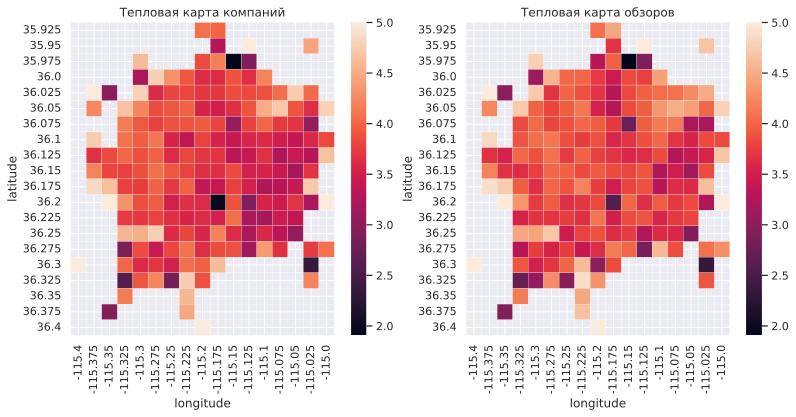

In [19]:
with sns.plotting_context(font_scale=0.2), sns.axes_style("darkgrid"):
    plt.figure(figsize=(13, 26))
    
    plt.subplot(4, 2, 1)
    sns.heatmap(pivot_companies, annot=False, linewidth=.2)
    plt.title('Тепловая карта компаний')

    plt.subplot(4, 2, 2)
    sns.heatmap(pivot_review, annot=False, linewidth=.2)
    plt.title('Тепловая карта обзоров')

Можно использовать каждый из графиков.

Если мы хотим оценить все компании района в целом, и непопулярные, и популярные, нам скорее нужна средня оценка по всем средним оценкам компаний в районе. Действительно, в этом случае лучшие оценки у тех районов, у которых любое из предприятий в этом районе в среднем лучше, чем у остальных.

Недостатки: в оценке участвуют закрытые компании / с совсем малым числом отзывов - и это существенный недостаток - компания может уже либо закрыться / может её услугами почти никто не пользуется - может, стоит оценивать более крупные компании с большим весом - поможет добавление весов.

Итак, мы можем хотеть оценить компании в районе пропорционально популярности. Если брать среднее по всем оценкам в районе, то мы по сути берём оценку популярных компаний в районе с большим весом, но это необязательно скажет о среднем качестве компаний. Например, может оказаться так, что есть в районе небольшое число очень популярных кафе, а остальные предприятия имеют очень низкий рейтинг, но с маленьким числом отзывов. Но у него все равно будет высокий рейтинг. В том числе стоит учитывать, что компаниям в разных категориях с разной частотой дают оценки. Больше оценок, например, будет у кафе/ресторанов, потому что в них чаще заходят люди, в том числе туристы и жители из других районов; в свою очередь обслуживание отдельного автомобиля в автомастерской будет занимать намного больше времени, поэтому у них будет меньше посетитилей и отзывов.

Тем не менее, у такого графика есть существенный плюс - мы оцениваем компании в районе с весом их популярности. Значит, такая тепловая карта обзоров подходит под наши требования больше.

В целом, характер обоих графиков остается примерно одинаковым, но по второй карте значения имеют более сглаженный характер.

Полученный график имеет ряд недостатков. Во-первых, не очень правильно судить о районе, если в нем мало компаний. Во-вторых, на графике цветовая гамма автоматически подстроилась под минимальное и максимальное значения оценки.

Почему эти недостатки могут быть существенными?

**Ответ:** Во-первых, это по сути выбросы из выборки: либо компании с маленьким число отзывов, а мы берем среднее в том числе по ним; либо отзывы с необоснованно высокой/низкой оценками, это может существенно влиять на оценку района, не являясь объективным фактором для оценки. Во-вторых, с такой подстройкой цветов не очень видно разницу между основной массой районов - их оценки сливаются в один красный цвет, есть только очень маленькое число районов с очень низкими и высокими оценками, которые как раз окрашиваются в черный и белый цвета.

Оставьте районы, в которых имеется информация о не менее $30$ компаний. Постройте новый график районов, использовав параметры `vmin` и `vmax` у функции `sns.heatmap`.

Как видно, большая часть оценок в отрезке [3.2, 4]. Там же и оставим границы для vmin vmax соответственно. Перед построением графикам избавимся от пустых полос по широте и долготе.

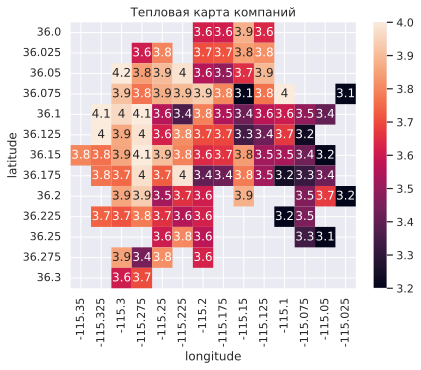

In [20]:
count_mean  = LasVegas_ed.pivot_table(index="latitude", columns="longitude", 
                                          values="Review mean", aggfunc={'mean', 'count'})

review_companies = count_mean[count_mean["count"] >= 30]["mean"]

review_companies = review_companies.dropna(axis=0, how='all')
review_companies = review_companies.dropna(axis=1, how='all')

with sns.plotting_context(font_scale=1), sns.axes_style("darkgrid"):
    sns.heatmap(review_companies, annot=True, vmin=3.2, vmax=4)
    plt.title('Тепловая карта компаний')


Сравните полученный график с предыдущим и сделайте вывод.

**Вывод:** На этом графике уже видно существенно различия между районами - на западе компании с большим средним рейтингом, чем на востоке, если усреднять, получим нечто около 3.8 и 3.3 на западе и востоке соответсвенно. На прошлом графике тоже можно проглядеть это, но тут это видно намного существеннее. Это, например, может быть связано с тем, что восточная часть города более промышленная, и в рейтинг входят с большими отрицательными рейтингами такие промышленные компании. Для более подробного исследования можно построить тепловые карты по категориям компаний.

#### 3. Рестораны

Будем считать компанию рестораном, если в поле `categories` *содержится* слово `restaurant`. Обратите внимание, что в анализе данных часто нет четкого формата данных. Например, данное слово может быть написано как с большой буквы, так и с маленькой; может как разделяться `;`, так и не разделяться. При возникновении недопонимания стоит посмотреть данные.

Составьте таблицу, в которой будет информация о всех ресторанах города `N`, для которых имеется не менее $5$ отзывов. Далее постройте heatmap-график районов, в котором каждому району сопоставьте среднюю оценку по ресторанам этого района. Рассматривайте только те районы, в которых есть не менее $10$ ресторанов, для каждого из которых есть не менее $5$ отзывов.

In [21]:
rest_LasVegas = LasVegas_ed.query("categories.str.contains('Restaurant','restaurant')") 
rest_LasVegas = rest_LasVegas[rest_LasVegas["Review count"] >= 5]

rest_LasVegas  = rest_LasVegas.pivot_table(index="latitude", columns="longitude", 
                                          values="Review mean", aggfunc={'mean', 'count'})
rest_LasVegas = rest_LasVegas[rest_LasVegas["count"] >= 10]["mean"]

Осталось построить heatmap-график. Обратим внимание, что есть один район с очень маленькой оценкой в 2.4 балла, но нижнюю оценку мы сместим для наглядности равнения остальных районов до 2.8.

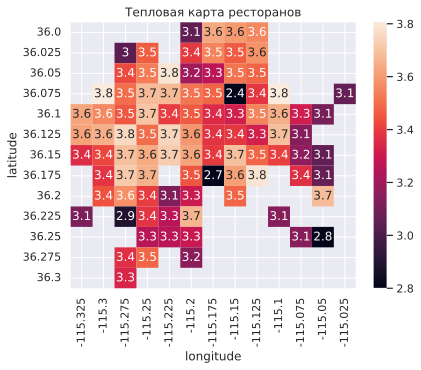

In [22]:
rest_LasVegas = rest_LasVegas.dropna(axis=0, how='all')
rest_LasVegas = rest_LasVegas.dropna(axis=1, how='all')

with sns.plotting_context(font_scale=1), sns.axes_style("darkgrid"):
    sns.heatmap(rest_LasVegas, annot=True, vmin=2.8)
    plt.title('Тепловая карта ресторанов')

Чем полезны ограничения снизу на количество отзывов для ресторана и количество ресторанов в районе?

**Ответ:** Это позволяет избавиться от выбросов - и от необъективных оценок ресторанов из-за маленького числа отзывов, и от необъективных оценок районов - из-за маленького числа ресторанов (нерепрезентативные выборки). 

Если говорить о самом графике, то прослеживается связь с предыдущим графиком. На западе опять оценки выше, чем на востоке. Из различий - оказывается, что оценки на втором графике в среднем меньше оценок на первом графике - рестораны имеют более низкие оценки, чем остальные компании по району. 

Кот Василий из города `N` очень придирчив к выбору ресторана. Он доверяет только ресторанам с высоким рейтингом, который основывается на большом количестве отзывов. Напечатайте в виде таблицы информацию $10$ ресторанах с самым большим рейтингом в порядке убывания рейтинга. Для каждого из этих ресторанов должно быть не менее $50$ отзывов. По каждому ресторану необходимо вывести следующую информации: название ресторана, средняя оценка, количество отзывов, географические координаты, категории.

In [23]:
good_rest = LasVegas.query("categories.str.contains('Restaurant','restaurant')") 
good_rest = good_rest[good_rest["Review count"] >= 50]
good_rest.sort_values("Review mean", ascending=False).head(10)

,Review mean,Review count,name,neighborhood,address,city,state,postal_code,latitude,longitude,is_open,categories
business_id,,,,,,,,,,,,
iBPyahdJRP5y0t25fF2W9w,4.966480,179,"""Lip Smacking Foodie Tours""",The Strip,"""3635 Las Vegas Blvd S""",Las Vegas,NV,89109,36.114537,-115.172678,1,Food Tours;Restaurants;Event Planning & Servic...
Fmij544FE1iOruoxI41kew,4.907692,65,"""Pepito Shack""",Downtown,"""1516 S Las Vegas Blvd""",Las Vegas,NV,89104,36.152477,-115.151945,0,Restaurants;Burgers;Food Stands;Sandwiches;Hot...
qw9SyduMZ53KB6GlBQqvZQ,4.890909,55,"""Bosa Boba Cafe""",Chinatown,"""3355 Spring Mountain Rd, Ste 35""",Las Vegas,NV,89102,36.125960,-115.184846,1,Vietnamese;Bubble Tea;Sandwiches;Food;Coffee &...
k9b96JXlNewj36ddrce9Jw,4.868132,91,"""Garden Grill""",Westside,"""302 S Rampart Blvd""",Las Vegas,NV,89145,36.166783,-115.286197,1,Tacos;Street Vendors;Farmers Market;Vegetarian...
IhNASEZ3XnBHmuuVnWdIwA,4.848069,1165,"""Brew Tea Bar""",Southwest,"""7380 S Rainbow Blvd, Ste 101""",Las Vegas,NV,89139,36.054195,-115.242443,1,Cafes;Tea Rooms;Food;Bubble Tea;Restaurants;De...
k5ddmLvAKKw9zSusRPM2cQ,4.836538,104,"""Poppa Naps BBQ""",Eastside,"""""",Las Vegas,NV,89121,36.116549,-115.088115,1,Food Stands;Hot Dogs;Caterers;Restaurants;Amer...
8fFTJBh0RB2EKG53ibiBKw,4.833333,180,"""Zenaida's Cafe""",Eastside,"""3430 E Tropicana Ave, Ste 32""",Las Vegas,NV,89121,36.101741,-115.100359,1,Restaurants;Breakfast & Brunch;Cafes
l1GJnB9TJgGgEeI4at1M0A,4.816754,191,"""El Frescos Cocina Mexicana""",Southeast,"""5030 Paradise Rd, Ste B""",Las Vegas,NV,89119,36.098527,-115.148446,0,Caterers;Mexican;Restaurants;Food;Event Planni...
hFT3HuxVZJb1uYEsYfp-0A,4.809524,63,"""Blaqcat Ultra Hookah Lounge""",Westside,"""6340 W Charleston Blvd, Ste 140""",Las Vegas,NV,89146,36.159742,-115.232738,1,Adult Entertainment;Lounges;Hookah Bars;Restau...


Нанесите на карту все рестораны со средней оценкой не менее $4.7$, которая посчитана по не менее $50$ отзывам. Отдельным цветом отметьте 10 ресторанов, которые вы получили ранее.

In [24]:
best_rest = good_rest[good_rest["Review mean"] >= 4.7]

the_best_rest = good_rest.sort_values("Review mean", ascending=False).head(10)

best_rest_filtered = best_rest[~best_rest.index.isin(the_best_rest.index)]


fig = px.scatter_mapbox(the_best_rest, lat="latitude", lon="longitude", hover_name="name",
                        color_discrete_sequence=['red'], zoom=9.5)

fig.add_scattermapbox(
    lat=the_best_rest['latitude'],
    lon=the_best_rest['longitude'],
    mode='markers',
    hovertemplate='%{hovertext}<br>Review mean: %{customdata}',
    customdata=the_best_rest['Review mean'].round(2),
    hovertext=the_best_rest['name'],
    marker=dict(
        size=8,
        color='red'
    ),
    name='Топ-10 лучших ресторанов'
)

fig.add_scattermapbox(
    lat=best_rest_filtered['latitude'],
    lon=best_rest_filtered['longitude'],
    mode='markers',
    hovertemplate='%{hovertext}<br>Review mean: %{customdata}',
    customdata=best_rest_filtered['Review mean'].round(2),
    hovertext=best_rest_filtered['name'],
    marker=dict(
        size=8,
        color='blue',
    ),
    name='Остальные лучшие рестораны'
)

fig.update_layout(
    title="Лучшие рестораны Лас-Вегаса",
    mapbox_style="open-street-map",
    autosize=True,
    margin=dict(t=50)
)
fig.write_html("4_full.html")

Охарактеризуйте кота Василия, а также сделайте общий вывод по задаче.

**Вывод:** Коту Василию подойдет далеко не каждый ресторан; подходящие ему расположены в основном в центре и к западу, к востоку и северу таких ресторанов чуть меньше. Он очень требовательный к качеству заведения.

Распределение этих ресторанов в целом подверждает общий вывод по Лас-Вегасу: на западе города расположены компании с большим рейтингом, чем на востоке, однако такие заведения расположены чуть более хаотично. 

Такая разница между районами, например, может быть связано с тем, что восточная часть города более промышленная, и в рейтинг входят с большими отрицательными рейтингами такие промышленные компании. Для более подробного исследования можно построить тепловые карты по категориям компаний и карты распределения по категориям.
